In [0]:
from __future__ import division
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from glob import glob
import time
import os

from ops import *
from utils import *

Today we are going to train GAN for generating faces and then we will make fun playing with it. Generative adversarial networks (GANs) are deep neural net architectures comprised of two nets, pitting one against the other (thus the “adversarial”). One neural network, called the generator, generates new faces, while the other, the discriminator,  decides whether each instance of face it reviews belongs to the actual training dataset or not.

Firstly download aligned faces of celebrities from here <a href="https://yadi.sk/d/xjuClJJH3MAVXh">link</a> and extract them into folder near ipython notebook.

In [0]:
!pip install -U -q PyDrive


from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials
# Authenticate and create the PyDrive client.
# This only needs to be done once per notebook.
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

In [0]:
file_id = '0B7EVK8r0v71pZjFTYXZWM3FlRnM' # URL id. 
downloaded = drive.CreateFile({'id': file_id})
downloaded.GetContentFile('img_celeba.zip')

In [0]:
import zipfile
with zipfile.ZipFile('img_celeba.zip') as zf:
        zf.extractall() 

In [0]:
mkdir 'preprocessed'

In [65]:
import cv2
DATA_PATH = 'img_align_celeba'
file_list = os.listdir(DATA_PATH)
preprocessed = 'preprocessed'
   
def crop_center(img,crop):
    
    x,y, _ = img.shape
    
    _x = int(x/2-(crop/2))
    
    _y = int(y/2-(crop/2)) 
    
    return img[_x:_x+crop,_y:_y+crop]

  
counter = 0
for f in file_list:
    
    original_file_path = os.path.join(DATA_PATH, f)
    img = cv2.imread(original_file_path)
        
    img = crop_center(img, 178)
        
    img = cv2.resize(img, (64, 64))
        
    cv2.imwrite(os.path.join(preprocessed, f), img)
  
    counter += 1  
    if counter % 20200 == 0:
        print("%d completed"%counter)  
         

20200 completed
40400 completed
60600 completed
80800 completed
101000 completed
121200 completed
141400 completed
161600 completed
181800 completed
202000 completed


# Implementation of GAN

In [0]:
import keras



```
# This is formatted as code
```

Constant variables below depends on your dataset and choosing of architecture.

In [0]:
DATA_PATH = 'preprocessed' # Path to the dataset with celebA faces
Z_DIM=100 # Dimension of face's manifold
GENERATOR_DENSE_SIZE=64*8 # Length of first tensor in generator

IMAGE_SIZE=64 # Shapes of input image
BATCH_SIZE=64 # Batch size
N_CHANNELS = 3 # Number channels of input image

MERGE_X = 8 # Number images in merged image
MERGE_Y = 8

In [0]:
assert(os.path.exists(DATA_PATH)), 'Please, download aligned celebA to DATA_PATH folder'

Let's define GAN. To do it, we need to define generator, discriminator and loss functions.

Here are some tips on the architecture of the generator:
1. The deeper is convolution, the less filters is using.
2. Apply deconvolutions-relu layers to achieve input image shape.
3. Use batch normalization before nonlinearity for speed and stability of learning.
4. Use tanh activation at the end of network (in this case images should be scaled to [-1, 1])
5. To force generator not to collapse and produce different outputs initialize bias with zero (see linear layer).

Other useful tips: https://github.com/soumith/ganhacks. Example of architecture see below. You may also use defined layers from ops.py. <b> Please, use names for layers started with "g\_" for generator and "d_" for discriminator.</b>

<img src="https://raw.githubusercontent.com/carpedm20/DCGAN-tensorflow/master/DCGAN.png">

In [0]:
from __future__ import division
import os
import time
import math
from glob import glob
import tensorflow as tf
import numpy as np
from six.moves import xrange

from ops import *
from utils import *

def conv_out_size_same(size, stride):
  return int(math.ceil(float(size) / float(stride)))

class DCGAN(object):
  def __init__(self, sess) :
    self.sess = sess

    self.batch_size = 64

    self.input_height = 64
    self.input_width = 64
    self.c_dim=3
    self.output_height = 64
    self.output_width = 64

    self.gf_dim = 64
    self.df_dim = 64

    #Batch normalization for the generator
    
    self.g_bn0 = batch_norm(name='g_bn0')
    self.g_bn1 = batch_norm(name='g_bn1')
    self.g_bn2 = batch_norm(name='g_bn2')
    self.g_bn3 = batch_norm(name='g_bn3')
    
    
    def generator(self,z,y):
        return generator_function(self,z,y)
        
    #Batch normalization for the discriminator
    
    self.d_bn1 = batch_norm(name='d_bn1')
    self.d_bn2 = batch_norm(name='d_bn2')
    self.d_bn3 = batch_norm(name='d_bn3')
        
    def discriminator(self,image, reuse=None):
        return discriminator_function(self,image, reuse=None)
      
    #Loss
    self.d_loss=0
    self.g_loss=0
    
    # Train variables
    
    self.save_frequency=100
    self.sample_frequency=100
    self.sample_dir='sample_faces'
    self.save_dir='checkpoint'
    self.load_dir=None
    
    # Interpolation
    
    self.alpha = np.linspace(0,1, num=BATCH_SIZE)

## Writing generator function (1 point)

In [0]:
def generator_function(self,z,y):
       
    s_h, s_w = self.output_height, self.output_width
    s_h2, s_w2 = conv_out_size_same(s_h, 2), conv_out_size_same(s_w, 2)
    s_h4, s_w4 = conv_out_size_same(s_h2, 2), conv_out_size_same(s_w2, 2)
    s_h8, s_w8 = conv_out_size_same(s_h4, 2), conv_out_size_same(s_w4, 2)
    s_h16, s_w16 = conv_out_size_same(s_h8, 2), conv_out_size_same(s_w8, 2)

        # project `z` and reshape
    self.z_, self.h0_w, self.h0_b = linear(z, self.gf_dim*8*s_h16*s_w16, 'g_h0_lin', with_w=True)

        #Write the network is model
        
    self.h0 = tf.reshape( self.z_, [-1, s_h16, s_w16, self.gf_dim * 8])
    h0 = tf.nn.relu(self.g_bn0(self.h0))

    self.h1, self.h1_w, self.h1_b = deconv2d( h0, [self.batch_size, s_h8, s_w8, self.gf_dim*4], name='g_h1', with_w=True)
    h1 = tf.nn.relu(self.g_bn1(self.h1))

    h2, self.h2_w, self.h2_b = deconv2d( h1, [self.batch_size, s_h4, s_w4, self.gf_dim*2], name='g_h2', with_w=True)
    h2 = tf.nn.relu(self.g_bn2(h2))

    h3, self.h3_w, self.h3_b = deconv2d( h2, [self.batch_size, s_h2, s_w2, self.gf_dim*1], name='g_h3', with_w=True)
    h3 = tf.nn.relu(self.g_bn3(h3))

    h4, self.h4_w, self.h4_b = deconv2d( h3, [self.batch_size, s_h, s_w, self.c_dim], name='g_h4', with_w=True)

    return tf.nn.tanh(h4)

Now let's define discriminator. Discriminator takes 3d tensor as input and outputs one number - probability that this is an image.

Some advice for discriminator's architecture:
1. Use batch normalization between convolutions and nonlinearities.
2. Use leaky relu with the leak about 0.2.
3. The deeper the layer, the more filters you can use.

If you use batch normalization, please define every layer in their own scope and pass is_training parameter there. Or you may use class of batch normalization from ops.py. Do not forget to fratten tensor after the convolution blocks.

## Writing discriminator function (1 point)

In [0]:
def discriminator_function(self,image, reuse=None):
    
    with tf.variable_scope('d', reuse=reuse):
     
        
      h0 = lrelu(conv2d(image, self.df_dim, name='d_h0_conv'))
      h1 = lrelu(self.d_bn1(conv2d(h0, self.df_dim*2, name='d_h1_conv')))
      h2 = lrelu(self.d_bn2(conv2d(h1, self.df_dim*4, name='d_h2_conv')))
      h3 = lrelu(self.d_bn3(conv2d(h2, self.df_dim*8, name='d_h3_conv')))
      h4 = linear(tf.reshape(h3, [-1, 8192]), 1, 'd_h3_lin')
      
    return tf.nn.sigmoid(h4), h4

Now let's define generator and discriminator.

In [0]:
tf.reset_default_graph()
is_training = tf.placeholder(tf.bool, name='is_training')

sess=tf.Session()

model = DCGAN(sess)

#Generator 

z = tf.placeholder(tf.float32, [None, Z_DIM], name='z')
G = generator_function(model,z, is_training)

#Discriminatior

images = tf.placeholder(tf.float32, shape=[None, IMAGE_SIZE, IMAGE_SIZE, N_CHANNELS])
    
D_real, D_real_logits = discriminator_function(model,images)
D_fake, D_fake_logits = discriminator_function(model,G, reuse=True)

Write definition of loss funstions according to formulas:
$$ D\_loss = \frac{-1}{m} \sum_{i=1}^{m}[\log{D(x_i)} + \log{(1 - D(G(z_i)))}]$$
$$ G\_loss = \frac{1}{m} \sum_{i=1}^{m} \log{(1 - D(G(z_i)))}$$

Or for better learning you may try other loss for generator:
$$ G\_loss = \frac{-1}{m} \sum_{i=1}^{m} \log{(D(G(z_i)))}$$

## Writing loss functions (2 points)

In [0]:
d_loss_real = tf.reduce_mean(
    tf.nn.sigmoid_cross_entropy_with_logits(
        logits=D_real_logits, 
        labels=tf.ones_like(D_real)
    )
)

d_loss_fake = tf.reduce_mean(
    tf.nn.sigmoid_cross_entropy_with_logits(
        logits=D_fake_logits, 
        labels=tf.zeros_like(D_fake)
    )
)

d_loss = d_loss_real + d_loss_fake

g_loss = tf.reduce_mean(
    tf.nn.sigmoid_cross_entropy_with_logits(
        logits=D_fake_logits, 
        labels=tf.ones_like(D_fake_logits)
    )
)

Create optimizers. We use different optimizers for discriminator and generator, so we needed a separate prefix for the discriminator and generator variables (g_ for generator, d_ for disciminator).

In [0]:
tvars = tf.trainable_variables()
## All variables of discriminator
d_vars = [v for v in tvars if 'd_' in v.name]

## All variables of generator
g_vars = [v for v in tvars if 'g_' in v.name]

LEARNING_RATE = 0.0002 # Learning rate for adam optimizer
BETA = 0.5 # Beta paramater in adam optimizer

##Optimizers - ypu may use your favourite instead.
d_optim = tf.train.AdamOptimizer(LEARNING_RATE, beta1=BETA).minimize(d_loss, var_list=d_vars)
g_optim = tf.train.AdamOptimizer(LEARNING_RATE, beta1=BETA).minimize(g_loss, var_list=g_vars) 

Load data:

In [132]:
data = glob('./'+preprocessed+'/*')
assert(len(data) > 0), "Length of training data should be more than zero"
print("Data:", len(data))


Data: 202599


Functions for training and evaluations.

In [133]:
!mkdir sample_faces

def load(sess, load_dir):
    """load network's paramaters
    
    load_dir : path to load dir
    """
    saver = tf.train.Saver()
    ckpt = tf.train.get_checkpoint_state(load_dir)
    if ckpt and ckpt.model_checkpoint_path:
            saver.restore(sess, ckpt.model_checkpoint_path)

mkdir: cannot create directory ‘sample_faces’: File exists


## Training GAN (1 point + 2 for good results)

In [0]:
def train(sess, _load, max_to_keep=1, n_epochs=5, n_generator_update=2):
    """train gan
    Parameters
    -------------------------------------------
    load_dir : str, default = None
        path to the folder with parameters
    save_frequency: int, default = 100
        how often save parameters []
    sample_frequency: int, default = None (not sample)
        how often sample faces
    sample_dir: str, default = samples
        directory for sampled images
    save_dir: str, default = 'checkpoint'
        path where to save parameters
    max_to_keep: int, default = 1
        how many last checkpoints to store
    model_name: str, default='dcgan.model'
        name of model
    n_epochs: int, default = 25 
        number epochs to train
    n_generator_update: int, default = 2
        how many times run generator updates per one discriminator update
    -------------------------------------------
    """
    
    saver = tf.train.Saver(max_to_keep=max_to_keep)
        
    if _load is not None:
       
        load(sess, _load)
        
              
    else:
      
        tf.global_variables_initializer().run(session=sess)

    
    sess.as_default()

        
    i=1
    
    for epoch in range(n_epochs):
      
        idxs = int(len(data)/BATCH_SIZE)
        
        for idx in range(0, idxs):
            
            #First we select the actual batch
          
            _data = data[idx*BATCH_SIZE:(idx+1)*BATCH_SIZE]
            
            batch = [get_image(data_in_batch, IMAGE_SIZE) for data_in_batch in _data]
            
            _images = np.array(batch).astype(np.float32)
            
            _batch = np.random.uniform(-1, 1, [BATCH_SIZE, Z_DIM]).astype(np.float32)

            # Update D network
            sess.run(
                d_optim, 
                feed_dict={images: _images, z: _batch,is_training: True}
            )

            # Update G network
            for _ in range(n_generator_update):
                sess.run(
                    g_optim,
                    feed_dict={z: _batch, is_training: True}
                )
                
            _D_fake = d_loss_fake.eval(
                {z: _batch, is_training: False},
                session=sess
            )
            _D_real = d_loss_real.eval(
                {images: _images, is_training: False},
                session=sess
            )
            _G = g_loss.eval(
                {z: _batch, is_training: False},
                session=sess
            )
                
            i += 1
            

            if i % 100 == 1:
                saver.save(sess, os.path.join('checkpoint', 'gan'))
                print("Saved model")

            if i % 100 == 1:
                print("Step: " + str(idx) + " Epoch: " + str(epoch) + " D_loss: " + str(_D_fake+_D_real) + " G_loss: " + str(_G) )
                samples = sess.run(G, feed_dict={z: _batch, is_training: False} )
                save_images(samples, [MERGE_X, MERGE_Y], os.path.join('sample_faces', 'train_' + str(epoch)+ '_' + str(idx) + '.png'))
                plt.imshow(inverse_transform(samples[1]))
                plt.show()

Saved model
Step: 99 Epoch: 0 D_loss: 1.0338216 G_loss: 1.2571775


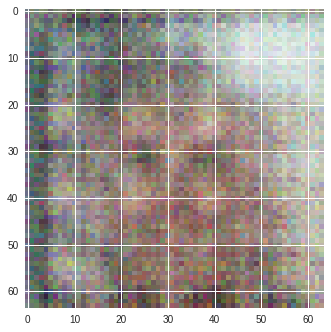

Saved model
Step: 199 Epoch: 0 D_loss: 1.444358 G_loss: 0.7519059


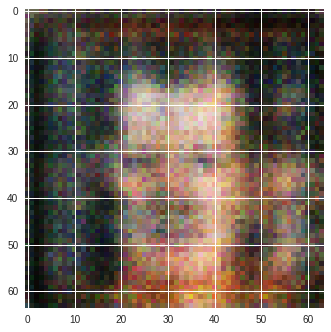

Saved model
Step: 299 Epoch: 0 D_loss: 1.6754603 G_loss: 0.8180506


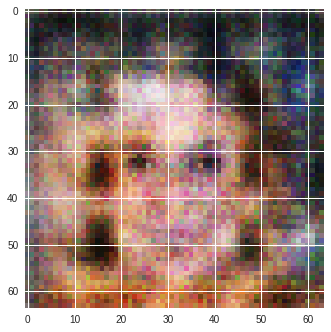

Saved model
Step: 399 Epoch: 0 D_loss: 2.2407107 G_loss: 0.42752028


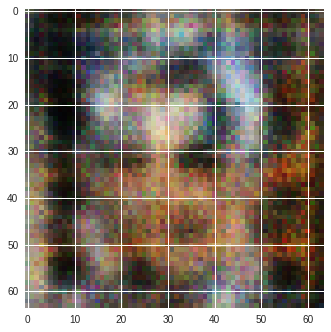

Saved model
Step: 499 Epoch: 0 D_loss: 1.3960547 G_loss: 0.64473754


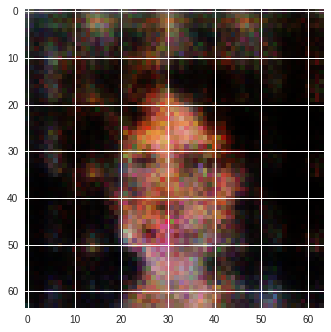

Saved model
Step: 599 Epoch: 0 D_loss: 1.4351459 G_loss: 0.44951645


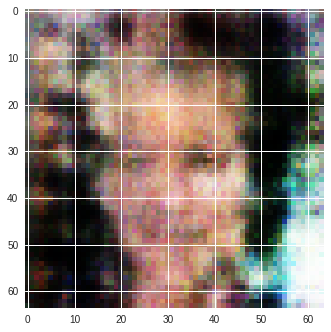

Saved model
Step: 699 Epoch: 0 D_loss: 1.6294341 G_loss: 0.6843133


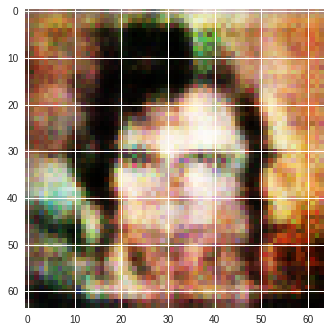

Saved model
Step: 799 Epoch: 0 D_loss: 1.5394306 G_loss: 0.6367184


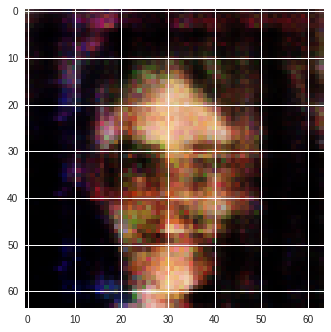

Saved model
Step: 899 Epoch: 0 D_loss: 1.5191935 G_loss: 0.64819175


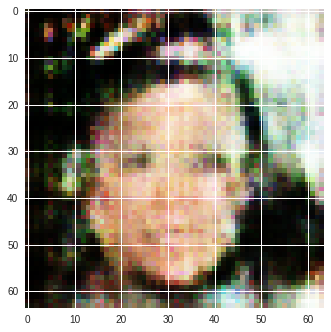

Saved model
Step: 999 Epoch: 0 D_loss: 1.3624158 G_loss: 0.54505897


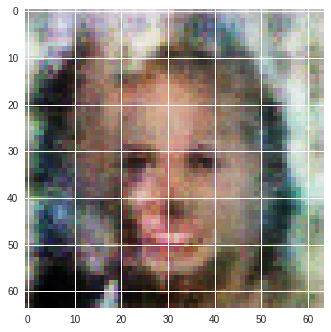

Saved model
Step: 1099 Epoch: 0 D_loss: 1.4482958 G_loss: 0.66415375


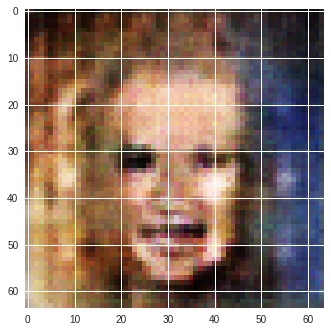

Saved model
Step: 1199 Epoch: 0 D_loss: 1.6942856 G_loss: 0.60150594


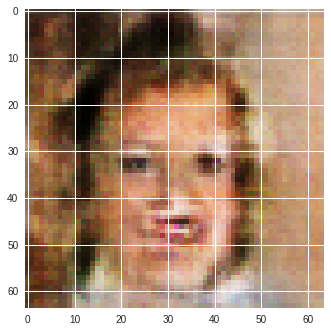

Saved model
Step: 1299 Epoch: 0 D_loss: 1.2484936 G_loss: 0.7306874


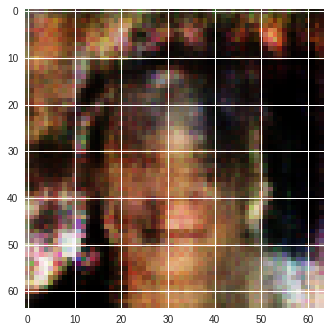

Saved model
Step: 1399 Epoch: 0 D_loss: 1.2031713 G_loss: 0.75982106


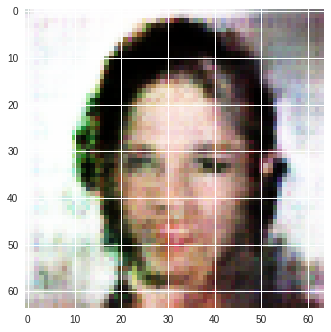

Saved model
Step: 1499 Epoch: 0 D_loss: 1.5205717 G_loss: 0.6012361


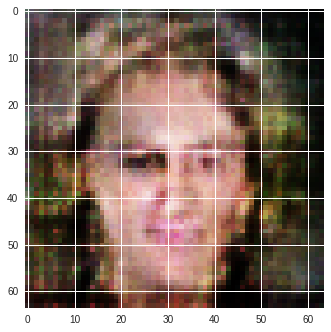

Saved model
Step: 1599 Epoch: 0 D_loss: 1.3486297 G_loss: 0.7350073


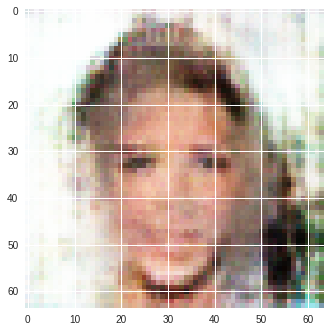

Saved model
Step: 1699 Epoch: 0 D_loss: 1.3852639 G_loss: 0.58619165


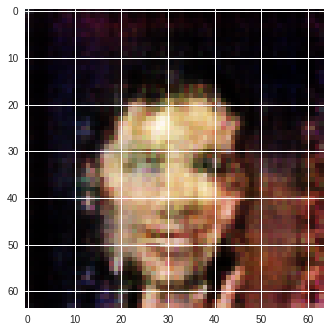

Saved model
Step: 1799 Epoch: 0 D_loss: 1.5283226 G_loss: 0.5796226


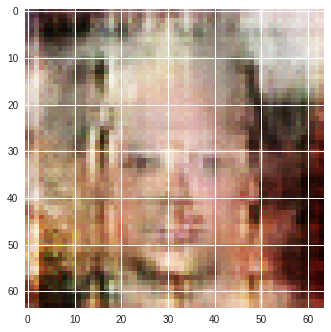

Saved model
Step: 1899 Epoch: 0 D_loss: 1.3931271 G_loss: 0.5471712


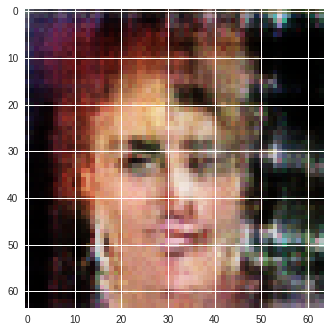

Saved model
Step: 1999 Epoch: 0 D_loss: 1.5058848 G_loss: 0.6922474


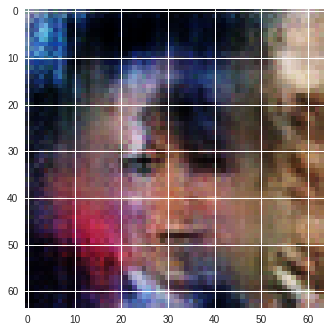

Saved model
Step: 2099 Epoch: 0 D_loss: 1.4550805 G_loss: 0.64248073


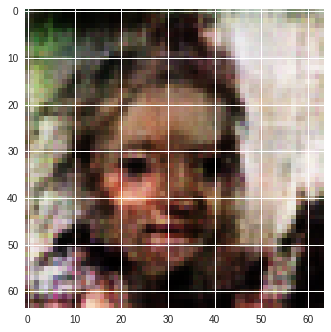

Saved model
Step: 2199 Epoch: 0 D_loss: 1.3390546 G_loss: 0.9256751


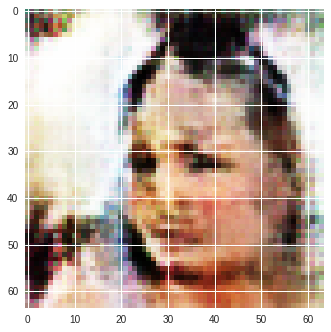

Saved model
Step: 2299 Epoch: 0 D_loss: 1.4992831 G_loss: 0.58388996


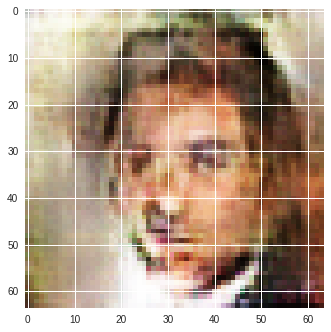

Saved model
Step: 2399 Epoch: 0 D_loss: 1.4494636 G_loss: 0.9391372


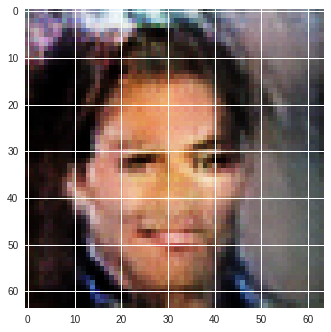

Saved model
Step: 2499 Epoch: 0 D_loss: 1.3574374 G_loss: 0.6555578


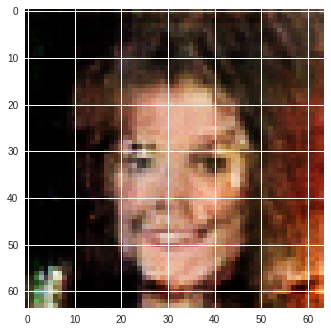

Saved model
Step: 2599 Epoch: 0 D_loss: 1.5739324 G_loss: 0.35981888


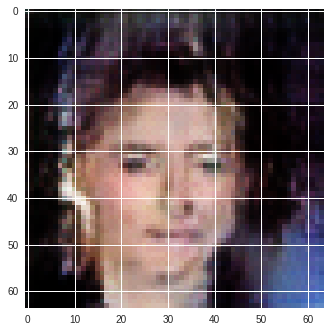

Saved model
Step: 2699 Epoch: 0 D_loss: 1.397294 G_loss: 0.6377225


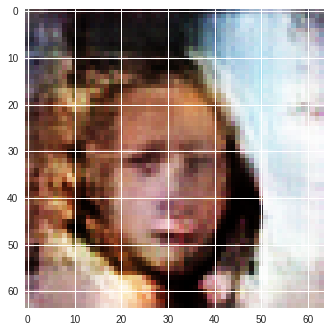

Saved model
Step: 2799 Epoch: 0 D_loss: 1.3364322 G_loss: 0.8283097


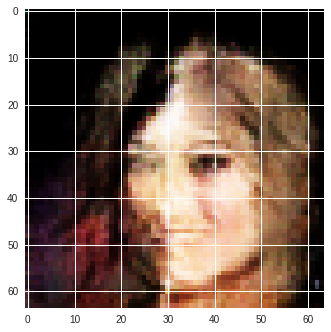

Saved model
Step: 2899 Epoch: 0 D_loss: 1.516777 G_loss: 0.73950255


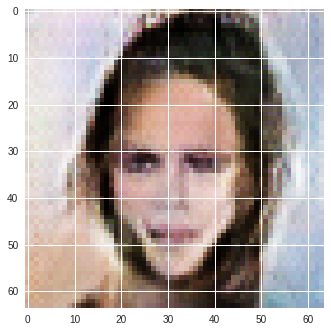

Saved model
Step: 2999 Epoch: 0 D_loss: 1.4148589 G_loss: 0.6402946


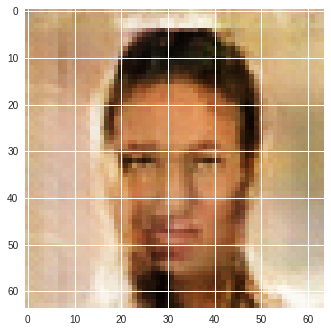

Saved model
Step: 3099 Epoch: 0 D_loss: 1.3041375 G_loss: 0.67311776


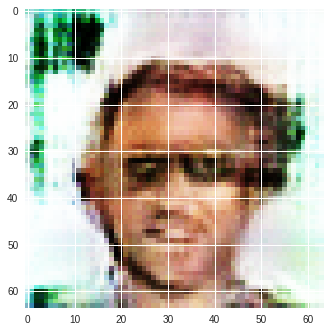

Saved model
Step: 34 Epoch: 1 D_loss: 1.4293139 G_loss: 0.55701554


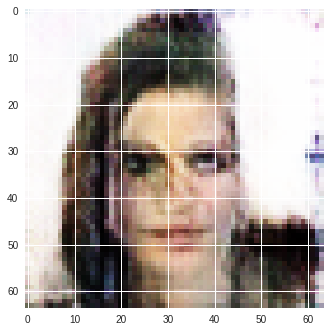

Saved model
Step: 134 Epoch: 1 D_loss: 1.6508325 G_loss: 0.33237356


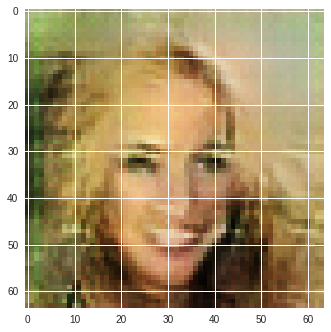

Saved model
Step: 234 Epoch: 1 D_loss: 1.4602824 G_loss: 0.7218433


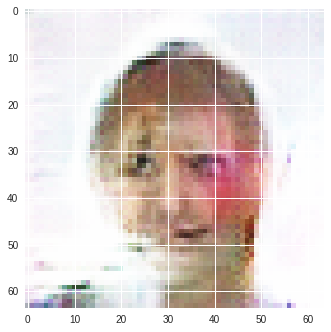

Saved model
Step: 334 Epoch: 1 D_loss: 1.5760647 G_loss: 0.60530436


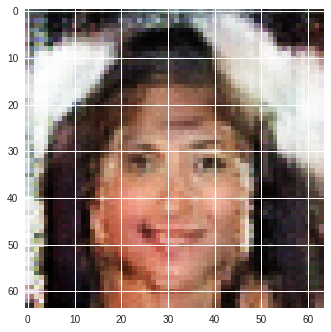

Saved model
Step: 434 Epoch: 1 D_loss: 1.3443096 G_loss: 0.7274766


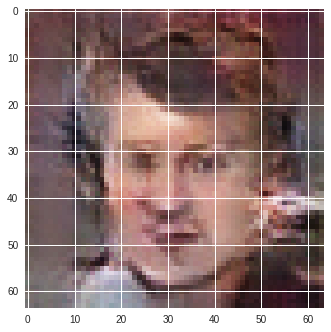

Saved model
Step: 534 Epoch: 1 D_loss: 1.4206636 G_loss: 0.6060714


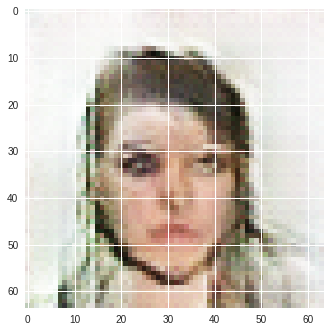

Saved model
Step: 634 Epoch: 1 D_loss: 1.4470905 G_loss: 0.60741484


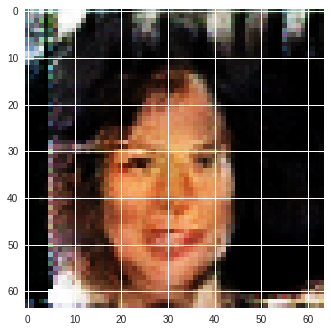

Saved model
Step: 734 Epoch: 1 D_loss: 1.5299437 G_loss: 0.46728724


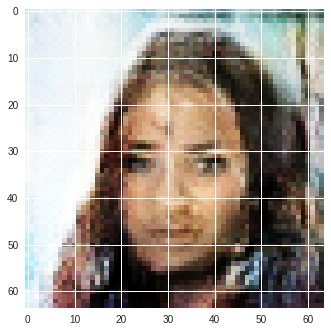

Saved model
Step: 834 Epoch: 1 D_loss: 1.4621387 G_loss: 0.6148664


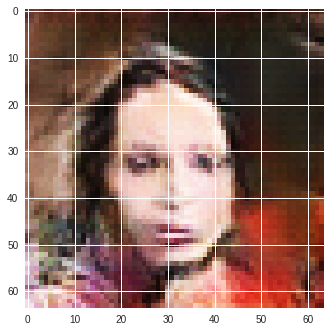

Saved model
Step: 934 Epoch: 1 D_loss: 1.4918516 G_loss: 0.6590531


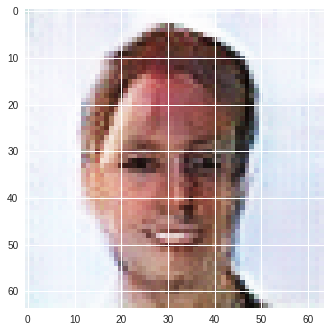

Saved model
Step: 1034 Epoch: 1 D_loss: 1.6020807 G_loss: 0.41832405


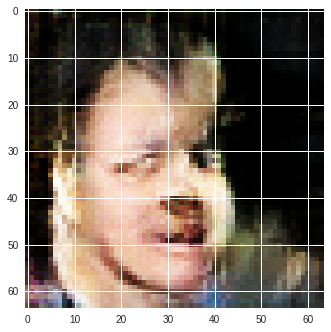

Saved model
Step: 1134 Epoch: 1 D_loss: 1.3805516 G_loss: 0.57217884


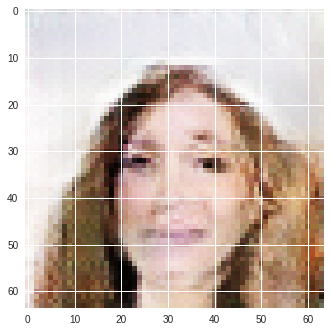

Saved model
Step: 1234 Epoch: 1 D_loss: 1.4656441 G_loss: 0.5106071


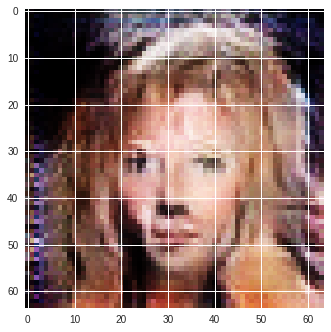

Saved model
Step: 1334 Epoch: 1 D_loss: 1.558236 G_loss: 0.51012516


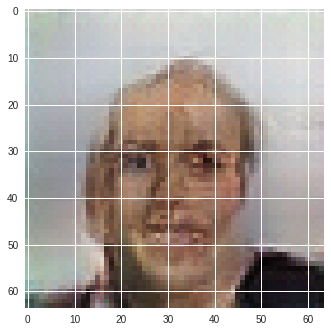

Saved model
Step: 1434 Epoch: 1 D_loss: 1.5661855 G_loss: 0.38242787


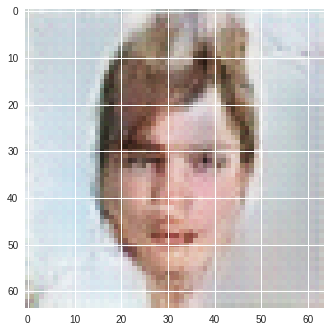

Saved model
Step: 1534 Epoch: 1 D_loss: 1.4346145 G_loss: 0.5678904


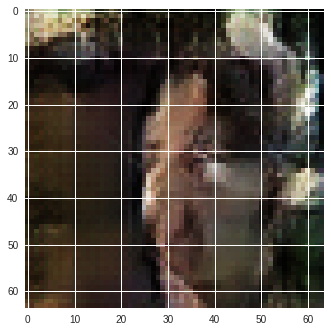

Saved model
Step: 1634 Epoch: 1 D_loss: 1.498268 G_loss: 0.49383467


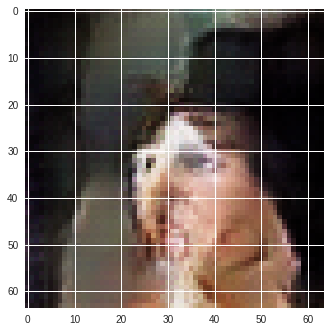

Saved model
Step: 1734 Epoch: 1 D_loss: 1.6863759 G_loss: 0.35189602


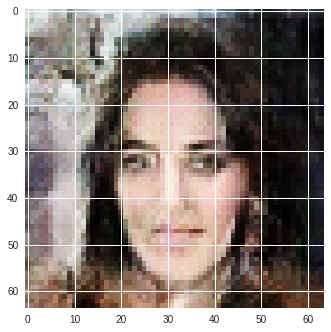

Saved model
Step: 1834 Epoch: 1 D_loss: 1.4196491 G_loss: 0.63232666


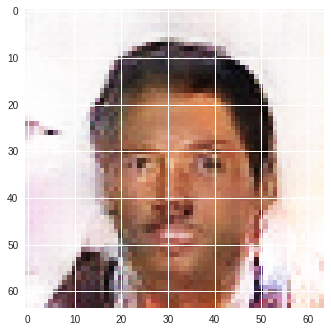

Saved model
Step: 1934 Epoch: 1 D_loss: 1.4987936 G_loss: 0.46940845


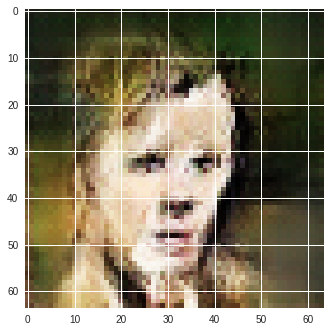

Saved model
Step: 2034 Epoch: 1 D_loss: 1.7659056 G_loss: 0.31330884


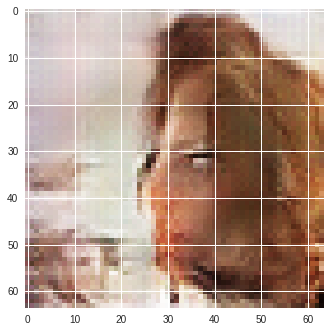

Saved model
Step: 2134 Epoch: 1 D_loss: 1.5357167 G_loss: 0.4736309


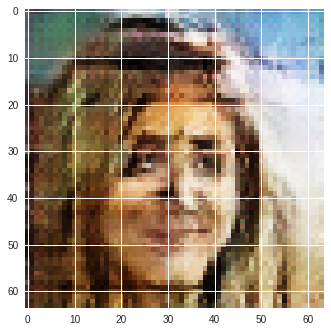

Saved model
Step: 2234 Epoch: 1 D_loss: 1.3827676 G_loss: 0.81933033


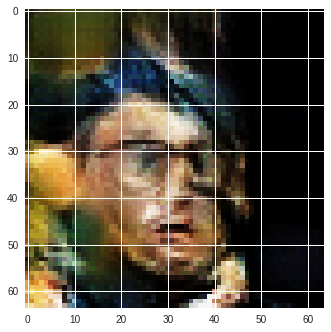

Saved model
Step: 2334 Epoch: 1 D_loss: 1.5987449 G_loss: 0.72997856


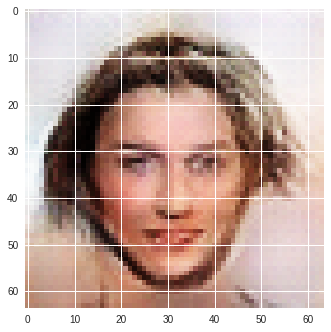

Saved model
Step: 2434 Epoch: 1 D_loss: 1.4507897 G_loss: 0.8021609


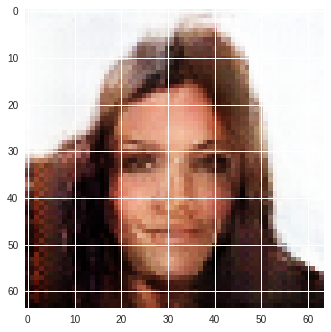

Saved model
Step: 2534 Epoch: 1 D_loss: 1.5016911 G_loss: 0.6553886


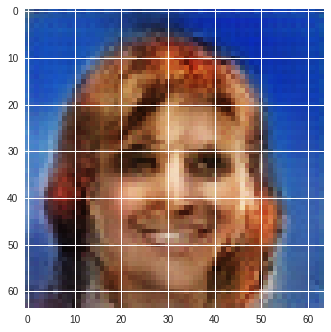

Saved model
Step: 2634 Epoch: 1 D_loss: 1.5562122 G_loss: 0.43571335


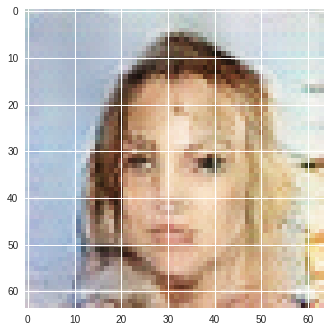

Saved model
Step: 2734 Epoch: 1 D_loss: 1.4137675 G_loss: 0.4860699


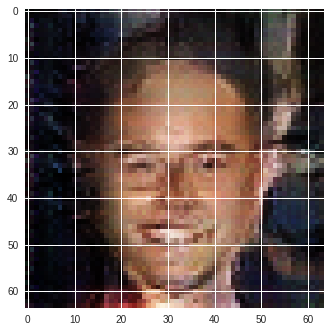

Saved model
Step: 2834 Epoch: 1 D_loss: 1.4910371 G_loss: 0.39432728


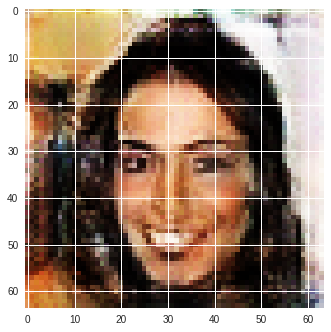

Saved model
Step: 2934 Epoch: 1 D_loss: 1.4538388 G_loss: 0.6164144


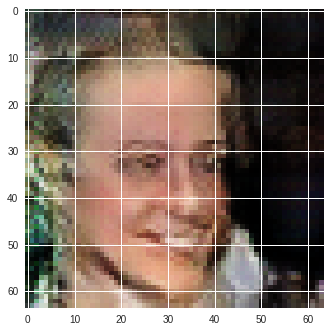

Saved model
Step: 3034 Epoch: 1 D_loss: 1.5324782 G_loss: 0.43461266


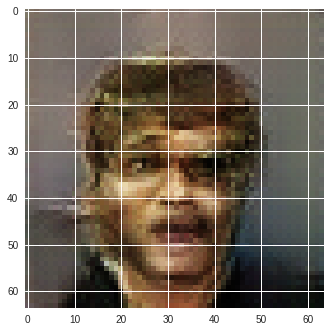

Saved model
Step: 3134 Epoch: 1 D_loss: 1.4578147 G_loss: 0.5116694


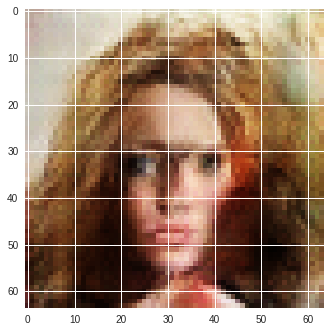

Saved model
Step: 69 Epoch: 2 D_loss: 1.5036415 G_loss: 0.5944797


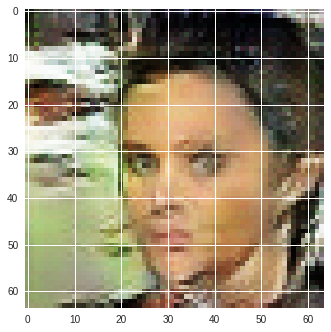

Saved model
Step: 169 Epoch: 2 D_loss: 1.5879772 G_loss: 0.35628027


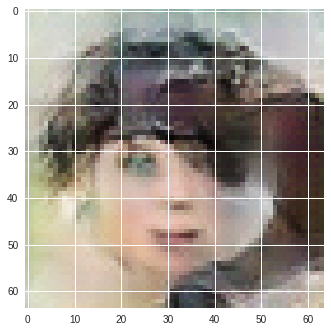

Saved model
Step: 269 Epoch: 2 D_loss: 1.693942 G_loss: 0.26753727


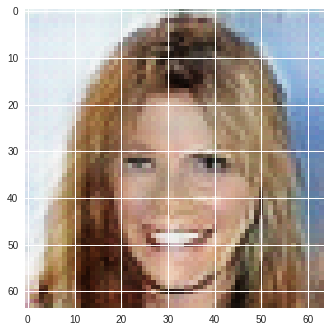

Saved model
Step: 369 Epoch: 2 D_loss: 1.4398286 G_loss: 0.58722526


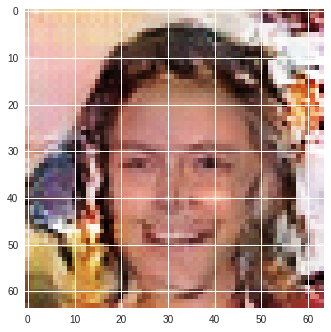

Saved model
Step: 469 Epoch: 2 D_loss: 1.5329361 G_loss: 0.8467058


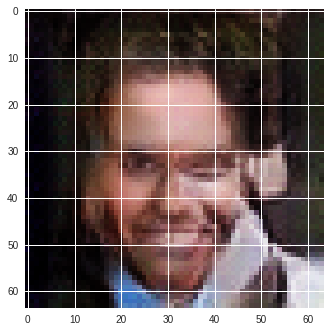

Saved model
Step: 569 Epoch: 2 D_loss: 1.4308077 G_loss: 0.38151067


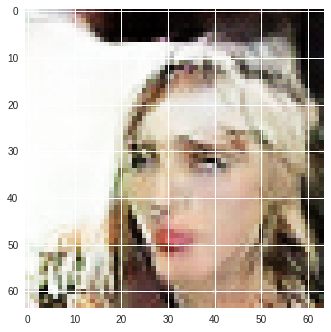

Saved model
Step: 669 Epoch: 2 D_loss: 1.2827222 G_loss: 0.58879876


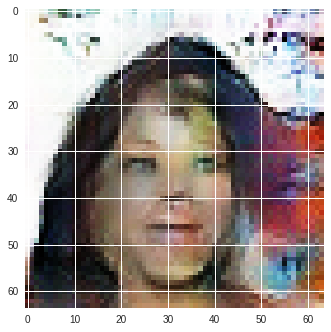

Saved model
Step: 769 Epoch: 2 D_loss: 1.5130439 G_loss: 0.7841495


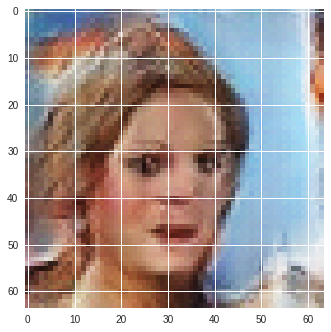

Saved model
Step: 869 Epoch: 2 D_loss: 1.418745 G_loss: 0.46358776


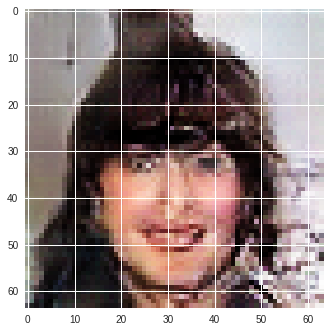

Saved model
Step: 969 Epoch: 2 D_loss: 1.8475562 G_loss: 0.22224647


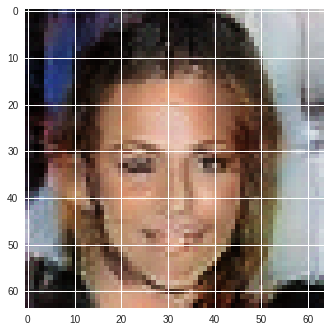

Saved model
Step: 1069 Epoch: 2 D_loss: 1.4210582 G_loss: 0.49540785


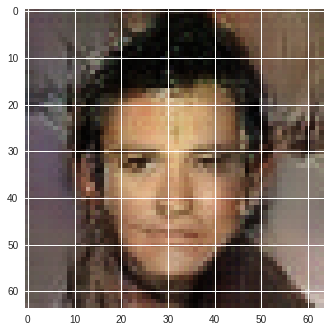

Saved model
Step: 1169 Epoch: 2 D_loss: 1.4485941 G_loss: 0.6404059


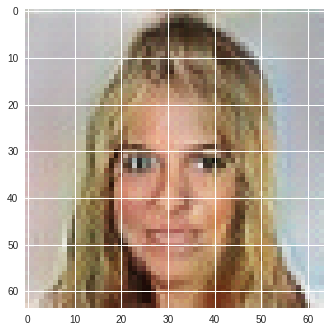

Saved model
Step: 1269 Epoch: 2 D_loss: 1.3399107 G_loss: 0.44199306


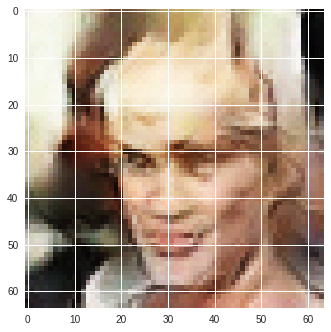

Saved model
Step: 1369 Epoch: 2 D_loss: 1.5984396 G_loss: 0.4768967


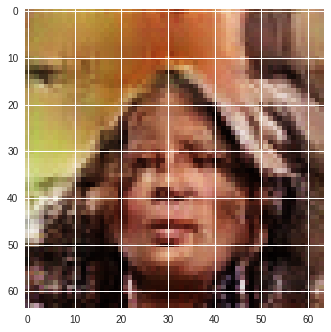

Saved model
Step: 1469 Epoch: 2 D_loss: 1.2202739 G_loss: 0.8077928


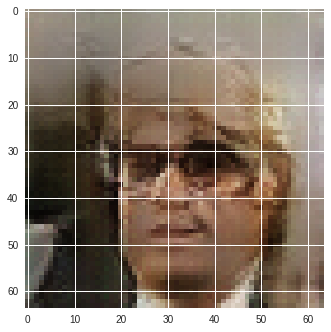

Saved model
Step: 1569 Epoch: 2 D_loss: 1.5115852 G_loss: 0.5805764


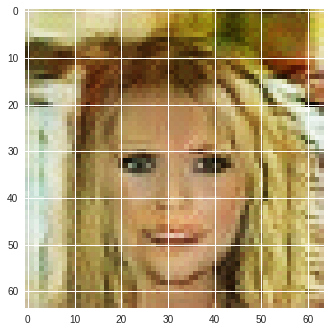

Saved model
Step: 1669 Epoch: 2 D_loss: 1.6177614 G_loss: 0.2823407


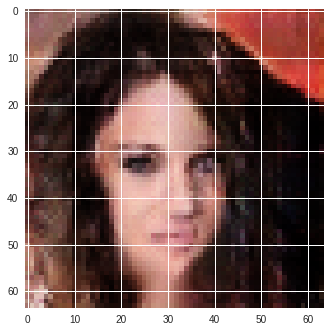

Saved model
Step: 1769 Epoch: 2 D_loss: 1.4409257 G_loss: 0.49318263


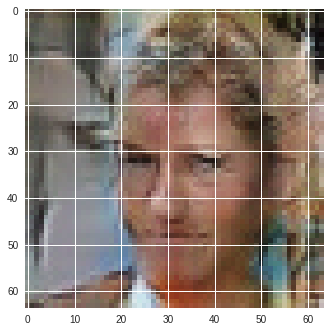

Saved model
Step: 1869 Epoch: 2 D_loss: 2.0556984 G_loss: 1.8402297


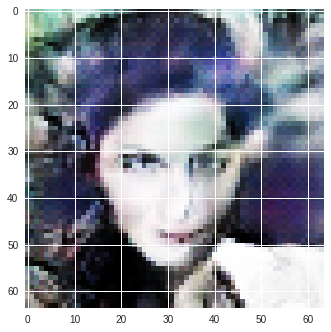

Saved model
Step: 1969 Epoch: 2 D_loss: 1.3166854 G_loss: 0.65926194


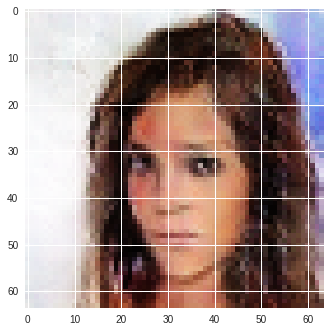

Saved model
Step: 2069 Epoch: 2 D_loss: 1.5539719 G_loss: 0.31703627


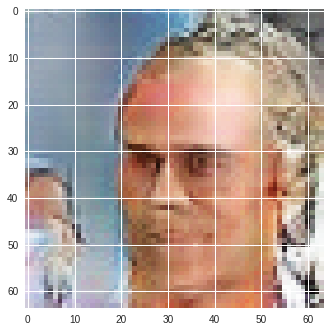

Saved model
Step: 2169 Epoch: 2 D_loss: 1.441792 G_loss: 0.47800928


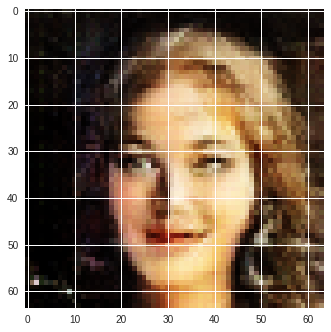

Saved model
Step: 2269 Epoch: 2 D_loss: 1.4200915 G_loss: 0.4626804


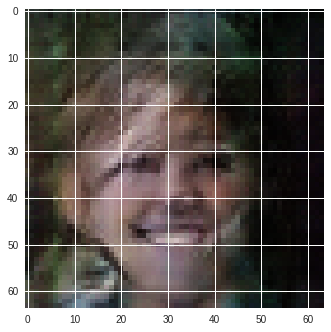

Saved model
Step: 2369 Epoch: 2 D_loss: 1.5527825 G_loss: 0.328851


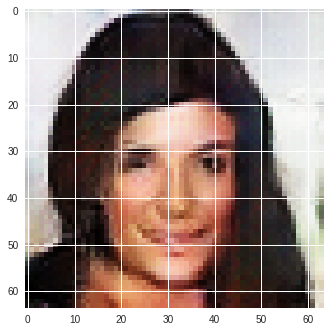

KeyboardInterrupt: ignored

In [136]:
with tf.Session() as sess:
    train(sess, _load=None)

If you generated something that looks like a face - it's cool! Add 2 points to your mark.

I had early because last time the gradient had exploded  last time and I had LOST such a good generator! The faces look good so we all should be ok with this.

## Face interpolation (1 point)

Let's interpolate between faces: generate two vectors $z_1$ and $z_2$ and get a batch of vectors of the form $\alpha\cdot z_1 + (1- \alpha)\cdot  z_2, \alpha \in [0,1].$ Generate faces on them and look at results. The generator displays pictures in the range from -1 to 1, so use the inverse transform function from the file utils.py.

INFO:tensorflow:Restoring parameters from checkpoint/gan


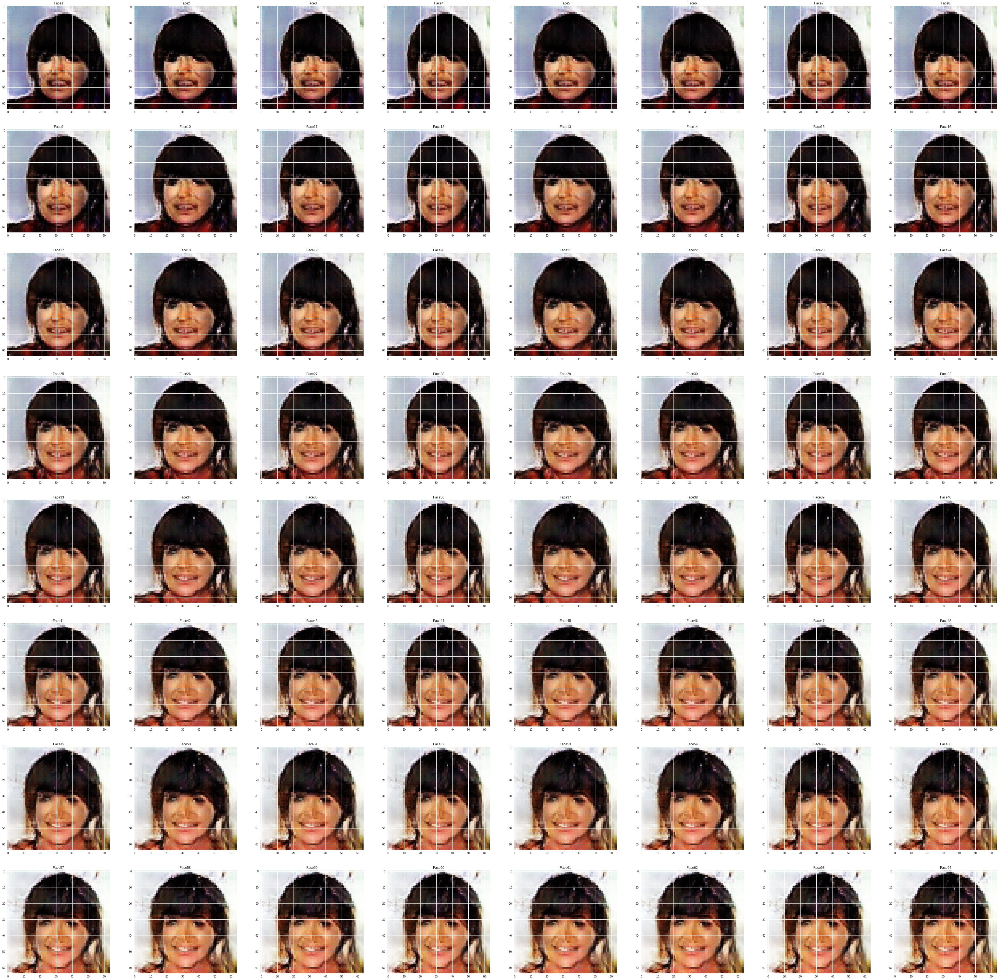

In [137]:
generated_image = []

with tf.Session() as sess:
    load(sess, 'checkpoint')
    
    #Generate two vectors at tange -1 to 1 with a normal
    z1 = np.random.normal(-1,1, Z_DIM)
    z2 = np.random.normal(-1,1, Z_DIM)
    
    alpha_range = np.linspace(0,1, num=BATCH_SIZE)
    
    _batch = np.array([alpha * z1 + (1-alpha) * z2 for alpha in alpha_range])
    
    #Run a session on it
    interpolation = sess.run(G, feed_dict={z: _batch, is_training: False})
    
    #Uses the inverse transform
    generated_image= inverse_transform(interpolation)

fig=plt.figure(figsize=(64, 64))
rows,cols = 8, 8
for i in range(1, rows*cols+1):
    image = generated_image[i-1]
    fig.add_subplot(rows, cols, i)
    plt.title('Face'+str(i))
    plt.imshow(image)  
plt.show()

In [140]:
import matplotlib.animation as animation
from IPython.display import HTML

fig = plt.figure()
plt.title('Animation from one face to another')
vid = []

for img in generated_image:
    frame = plt.imshow(img/2+0.5, animated=True)
    vid.append([frame])

ani = animation.ArtistAnimation(fig, vid, interval=50, blit=True, repeat_delay=1000)

plt.close()
HTML(ani.to_jshtml(15,default_mode='reflect'))

#Special thanks for a guy in the forum that had this idea!

## Adding a smile (1 point + 1 point for good results)

Let's make face smiling. Find several vectors z, such that the generator generates smiling faces and not. Five vectors in every group should be enough (but the more, the better).

Calculate "smile vector" as mean of vectors z with generated smile on it minus mean of vectors z with generated not smile on it.

Look at the result of applying the smile vector: compare the results of generation before and after the addition of the smile vector.

INFO:tensorflow:Restoring parameters from checkpoint/gan


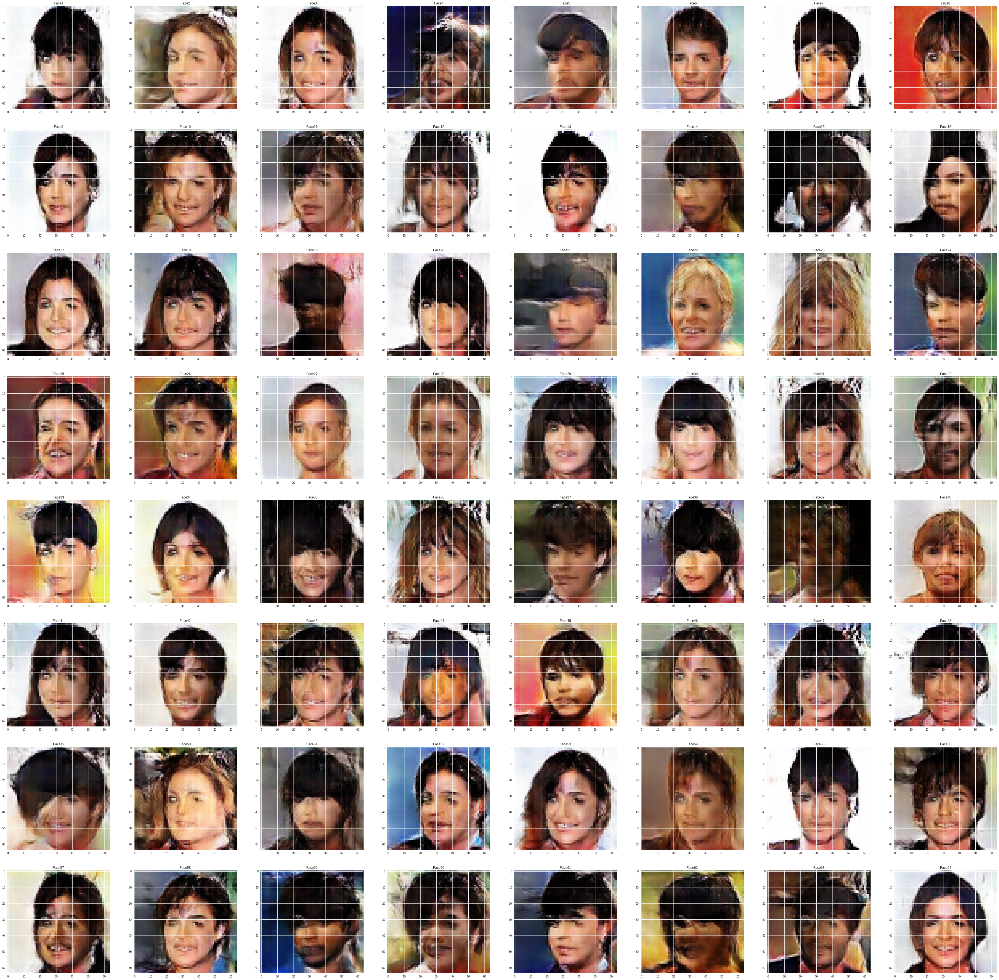

In [210]:
generated_image = []
batchz = []

with tf.Session() as sess:
    load(sess, 'checkpoint')
    
    #Generate vectors at range -1 to 1 with a normal
     
    batchz = np.random.normal(-1,1,size=[BATCH_SIZE, Z_DIM]).astype(np.float32)
    
    #Run a session on it
    interpolation = sess.run(G, feed_dict={z: batchz, is_training: False})
    
    #Uses the inverse transform
    generated_image= inverse_transform(interpolation)

fig=plt.figure(figsize=(64, 64))
rows,cols = 8, 8

#Display it!

for i in range(1, rows*cols+1):
    image = generated_image[i-1]
    fig.add_subplot(rows, cols, i)
    plt.imshow(image)  
    plt.title('Face'+str(i))
plt.show()

I think that the results are good, you should see that the result might be see bad because of the higer resolution.

If faces looks really cool, add bonus 1 point to your score.

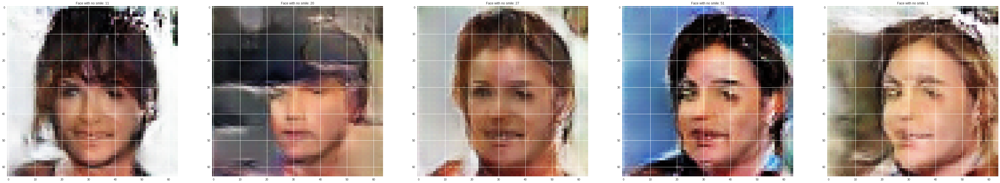

INFO:tensorflow:Restoring parameters from checkpoint/gan


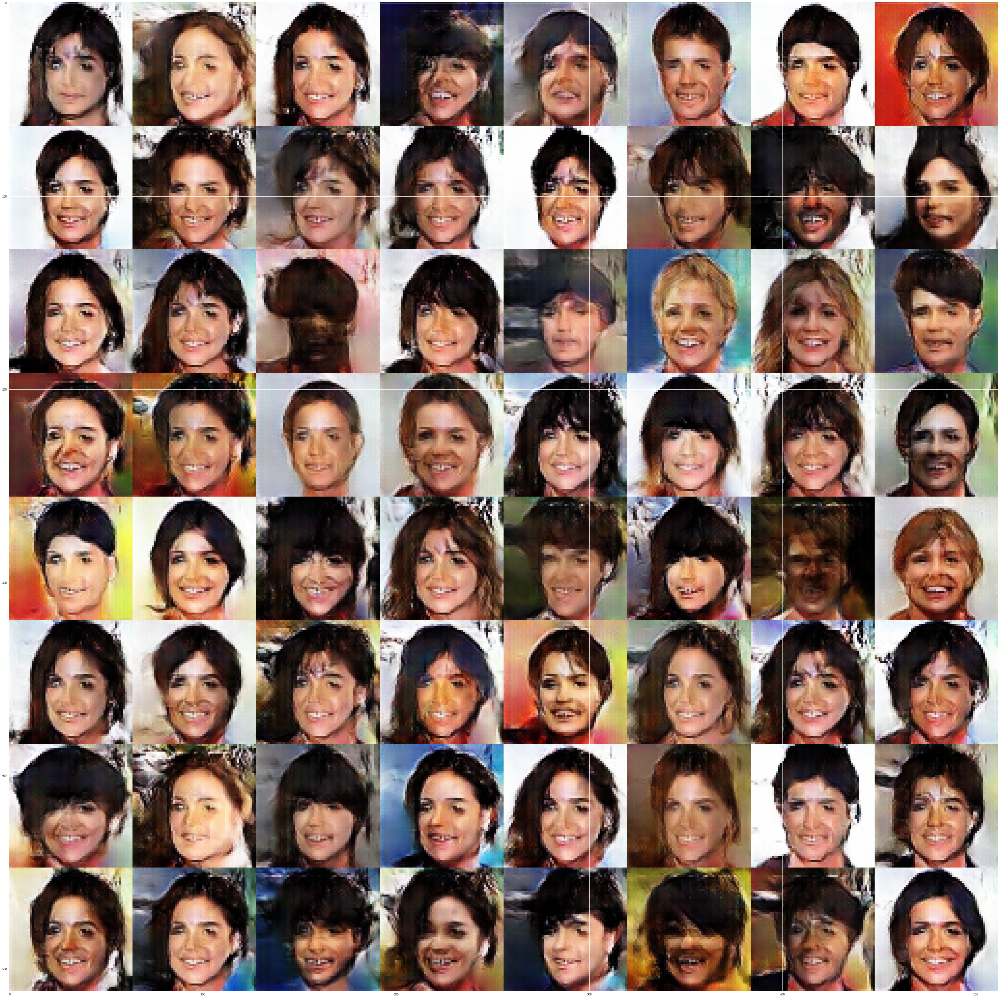

In [221]:
not_smile_idx = [11, 20, 27, 51, 1]

# Display the odd faces now smiling
fig = plt.figure(figsize=(64, 64))
rows,cols = 1, 5
for i in range(1, 6):
    image = generated_image[not_smile_idx[i-1]]
    fig.add_subplot(rows, cols, i)
    plt.imshow(image)  
    plt.title('Face with no smile: '+str(not_smile_idx[i-1]))
plt.show()

not_smile_idx = [10, 19, 26, 40, 0]
smile_idx= [16, 25, 52, 63, 2 ]

#We just need to find the diference between the meand between the smiling images and with no smiling!

smile_z = batchz[smile_idx]
not_smile_z = batchz[not_smile_idx]
smile_vec = np.mean(smile_z, axis=0) - np.mean(not_smile_z, axis=0)

with tf.Session() as sess:
    load(sess, 'checkpoint')
    
    #Than we subtract the mean value of not smiling and sum the smiling factor
    
    batch_z = batchz +   smile_vec
    samples = sess.run(G, feed_dict={z: batch_z, is_training: False} )
    imgs = inverse_transform(samples)
    
    #Then we can display all images with a smile
    
    mega_image = merge(
        imgs, 
        [int(np.sqrt(float(BATCH_SIZE))), int(np.sqrt(float(BATCH_SIZE)))]
    )
    
    fig = plt.figure(2, figsize = (64,64))
    sub_plot = fig.add_subplot(111)
    sub_plot.imshow(mega_image)

I liked the results! They are pretty good for only 2 epochs. I had learned a lot of things in this assignment and the animation was inspired by a guy that had submitted in the forum. I hope that you had get along with this assignment too!